<a href="https://colab.research.google.com/github/aborbala/tree-canopy/blob/main/04_01_evaluate_and_compare_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install pyyaml torch torchvision opencv-python

In [3]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 19.2 MB/s eta 0:00:00


In [4]:
# Change directory to your Google Drive
%cd /content/drive/MyDrive/

# Clone the Detectron2 repository
#!git clone https://github.com/facebookresearch/detectron2.git

# Change directory to the cloned repository
%cd detectron2

# Install Detectron2 (the -e flag means "editable mode", so changes to the code will immediately take effect)
!pip install -e .

/content/drive/MyDrive
/content/drive/MyDrive/detectron2
Obtaining file:///content/drive/MyDrive/detectron2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 18.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61400 sha256=d4abf7496266134fad6504810bfa990b739be04716c4b286d0b9dc0ce812adf6
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-an

In [27]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import os
import torch
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2 import model_zoo
import json
import glob
import yaml

In [33]:
# Directory where your model folders are located
data_folder = "/content/drive/MyDrive/data/400_5816/"
model_directory = os.path.join(data_folder, 'models/')
image_root = os.path.join(data_folder, 'sliced_output_2020S/')

In [34]:
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog

json_file = os.path.join(data_folder, "val.json")

# Register your dataset (assuming COCO format)
register_coco_instances("my_dataset_val", {}, json_file, image_root)

# Ensure the metadata is correctly loaded
metadata = MetadataCatalog.get("my_dataset_val")
print(metadata)

AssertionError: Dataset 'my_dataset_val' is already registered!

[07/12 09:43:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/data/400_5816/models/model_aoi400_5816_70p_1000i.pth ...


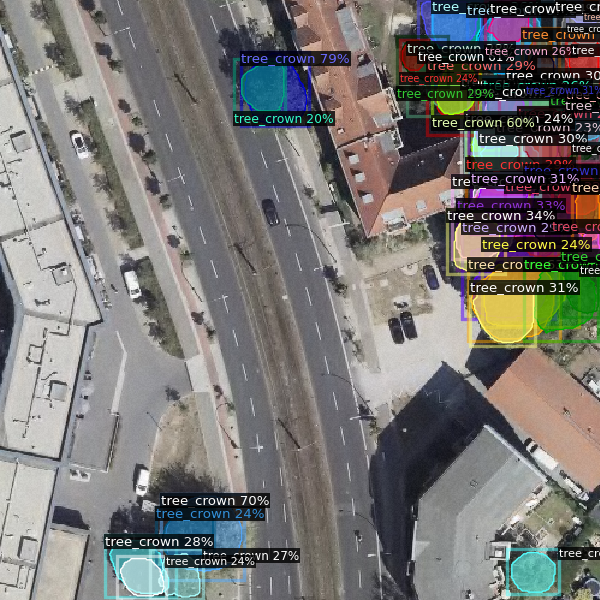

[07/12 09:43:38 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/12 09:43:38 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/12 09:43:38 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/12 09:43:38 d2.data.datasets.coco]: Loaded 43 images in COCO format from /content/drive/MyDrive/data/400_5816/val.json
[07/12 09:43:38 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/12 09:43:38 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/12 09:43:38 d2.data.common]: Serializing 43 elements to byte tensors and concatenating them all ...
[07/12 09:43:38 d2.data.common]: Serialized dataset tak

In [39]:
#  SINGLE MODEL INSPECTION
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow

# Load the config
cfg = get_cfg()
cfg.set_new_allowed(True)  # Add this line before merging the file
cfg.merge_from_file("/content/drive/MyDrive/data/400_5816/models/model_aoi400_5816_70p_1000i_config.yaml")

# Update config with the correct path to the model weights
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/data/400_5816/models/model_aoi400_5816_70p_1000i.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2  # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_val",)

# Create a predictor
predictor = DefaultPredictor(cfg)

# Example of using the predictor on an image
img = cv2.imread("/content/drive/MyDrive/data/400_5816/sliced_output_2020S/3dm_33_400_5816_1_be_nobuild_0_3.tif")
outputs = predictor(img)
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get('my_dataset_val'), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])
# Set up the evaluator and test data loader
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")

# Run the evaluation
print("Evaluating the model...")
evaluation_results = inference_on_dataset(predictor.model, val_loader, evaluator)
print("Evaluation results:")
print(evaluation_results)

In [17]:
# Pattern to match all cached COCO annotation files
# This assumes the naming convention is consistent as per your previous message
annotation_pattern = os.path.join(model_directory, "*/my_dataset_val_coco_format.json")

# Find all files matching the pattern
cached_annotation_files = glob.glob(annotation_pattern)

# Iterate and remove each file
for file_path in cached_annotation_files:
    if os.path.exists(file_path):
#        os.remove(file_path)
        print(f"Removed cached annotations file: {file_path}")
    else:
        print(f"File not found (already removed?): {file_path}")

# Confirm completion
print("All cached annotations files have been removed.")

All cached annotations files have been removed.


In [40]:
model_paths = [os.path.join(model_directory, f) for f in os.listdir(model_directory) if f.endswith('.pth')]

models = {}
cfgs = {}

# Load each model and its configuration
for path in model_paths:
    model_name = os.path.basename(path).split('.pth')[0]
    print(model_name)
    config_path = os.path.join(model_directory, f"{model_name}_config.yaml")

    cfg = get_cfg()
    cfg.set_new_allowed(True)  # Add this line before merging the file
    cfg.merge_from_file(config_path)
    cfg.MODEL.WEIGHTS = path
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1
    cfg.TEST.DETECTIONS_PER_IMAGE = 1000
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
    cfg.OUTPUT_DIR = os.path.join(model_directory, model_name)

    models[model_name] = DefaultPredictor(cfg)
    cfgs[model_name] = cfg  # Store the configuration

# Print the loaded models to confirm
print("Loaded models:")
for model_name in models:
    print(f"Model name: {model_name}")

# Print the configurations to confirm
print("\nConfigurations:")
for model_name, cfg in cfgs.items():
    print(f"Model name: {model_name}, Config: {cfg}")

model_aoi400_5816_70p_1000i
[07/12 09:50:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/data/400_5816/models/model_aoi400_5816_70p_1000i.pth ...
Loaded models:
Model name: model_aoi400_5816_70p_1000i

Configurations:
Model name: model_aoi400_5816_70p_1000i, Config: CUDNN_BENCHMARK: False
DATALOADER:
  ASPECT_RATIO_GROUPING: True
  FILTER_EMPTY_ANNOTATIONS: True
  NUM_WORKERS: 2
  REPEAT_THRESHOLD: 0.0
  SAMPLER_TRAIN: TrainingSampler
DATASETS:
  PRECOMPUTED_PROPOSAL_TOPK_TEST: 1000
  PRECOMPUTED_PROPOSAL_TOPK_TRAIN: 2000
  PROPOSAL_FILES_TEST: ()
  PROPOSAL_FILES_TRAIN: ()
  TEST: ()
  TRAIN: ('my_dataset_train',)
  VAL: ['my_dataset_val']
GLOBAL:
  HACK: 1.0
INPUT:
  CROP:
    ENABLED: False
    SIZE: [0.9, 0.9]
    TYPE: relative_range
  FORMAT: BGR
  MASK_FORMAT: polygon
  MAX_SIZE_TEST: 1333
  MAX_SIZE_TRAIN: 1333
  MIN_SIZE_TEST: 800
  MIN_SIZE_TRAIN: (640, 672, 704, 736, 768, 800)
  MIN_SIZE_TRAIN_SAMPLING: choice
  RANDOM_FLIP

In [19]:
#Load annotation
json_file = os.path.join(data_folder, "val.json")

with open(json_file) as f:
    annotations = json.load(f)

print("Annotations sample:", annotations["annotations"][0])

Annotations sample: {'id': 1, 'image_id': 0, 'category_id': 0, 'segmentation': [[485, 0, 484, 1, 483, 1, 482, 2, 482, 6, 481, 7, 481, 11, 482, 11, 483, 12, 484, 12, 485, 13, 486, 13, 487, 14, 488, 13, 490, 13, 491, 14, 496, 14, 497, 15, 499, 15, 499, 0]], 'bbox': [481, 0, 19, 16], 'area': 231.5, 'iscrowd': 0}


In [41]:
from detectron2.data.datasets import load_coco_json
from detectron2.data import DatasetCatalog, MetadataCatalog
import os

dataset_name = 'my_dataset_val'

# Function to load validation data
def get_val_data():
    return load_coco_json(json_file, image_root, dataset_name)

# Remove and re-register the dataset to ensure it's updated
if dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(dataset_name)

DatasetCatalog.register(dataset_name, get_val_data)
MetadataCatalog.get(dataset_name).set(thing_classes=["tree_crown"], json_file=json_file)

# Print the metadata to confirm registration
my_dataset_val_metadata = MetadataCatalog.get(dataset_name)
print(my_dataset_val_metadata)

# Check if the JSON file exists
print(f"Checking if JSON file exists at: {json_file}")
if not os.path.exists(json_file):
    raise FileNotFoundError(f"The JSON file was not found at {json_file}")
else:
    print("JSON file found.")

dataset_dicts = get_val_data()
print(f"Number of samples in validation dataset: {len(dataset_dicts)}")
print("Sample data:", dataset_dicts[0])

Metadata(name='my_dataset_val', json_file='/content/drive/MyDrive/data/400_5816/val.json', image_root='/content/drive/MyDrive/data/400_5816/sliced_output_2020S/', evaluator_type='coco', thing_classes=['tree_crown'], thing_dataset_id_to_contiguous_id={0: 0})
Checking if JSON file exists at: /content/drive/MyDrive/data/400_5816/val.json
JSON file found.
WARNING [07/12 09:50:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/12 09:50:23 d2.data.datasets.coco]: Loaded 43 images in COCO format from /content/drive/MyDrive/data/400_5816/val.json
Number of samples in validation dataset: 43
Sample data: {'file_name': '/content/drive/MyDrive/data/400_5816/sliced_output_2020S/3dm_33_401_5817_1_be_nobuild_5_1.tif', 'height': 500, 'width': 500, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [480, 0, 20, 13], 'category_id': 0, 'segmentation': [[492, 0, 492, 1, 490, 3, 488, 3, 487, 4, 484, 4, 480, 8, 482, 8, 483, 7, 486, 7, 

In [42]:
# Evaluation
evaluation_results = {}

for model_name, predictor in models.items():
    print(f"Evaluating... {model_name}:")
    cfg = cfgs[model_name]

    output_dir = os.path.join(model_directory, model_name)
    os.makedirs(output_dir, exist_ok=True)  # Create output directory

    evaluator = COCOEvaluator(dataset_name, cfg, False, output_dir=output_dir)

    val_loader = build_detection_test_loader(cfg, dataset_name)
    results = inference_on_dataset(predictor.model, val_loader, evaluator)
    evaluation_results[model_name] = results

    # Save the results as a JSON file
    results_file = os.path.join(output_dir, f"{model_name}_evaluation_results.json")
    with open(results_file, 'w') as f:
        json.dump(results, f, indent=4)

# Display evaluation results
for model_name, results in evaluation_results.items():
    print(f"Results for {model_name}:")
    print(results)


Evaluating... model_aoi400_5816_70p_1000i:
[07/12 09:50:27 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/12 09:50:27 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/12 09:50:27 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/12 09:50:27 d2.data.datasets.coco]: Loaded 43 images in COCO format from /content/drive/MyDrive/data/400_5816/val.json
[07/12 09:50:27 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/12 09:50:27 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/12 09:50:27 d2.data.common]: Serializing 43 elements to byte tensors and concatenating them all ...
[07/12 09:50

In [43]:
print("Sample file paths and annotations:")
for i in range(3):
    print(f"File path: {dataset_dicts[i]['file_name']}")
    print(f"Annotations: {dataset_dicts[i]['annotations']}")


Sample file paths and annotations:
File path: /content/drive/MyDrive/data/400_5816/sliced_output_2020S/3dm_33_401_5817_1_be_nobuild_5_1.tif
Annotations: [{'iscrowd': 0, 'bbox': [480, 0, 20, 13], 'category_id': 0, 'segmentation': [[492, 0, 492, 1, 490, 3, 488, 3, 487, 4, 484, 4, 480, 8, 482, 8, 483, 7, 486, 7, 487, 6, 488, 6, 489, 7, 489, 8, 490, 9, 490, 10, 492, 12, 498, 6, 498, 4, 499, 3, 499, 0]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [457, 277, 43, 53], 'category_id': 0, 'segmentation': [[497, 277, 493, 281, 491, 281, 490, 282, 485, 282, 484, 283, 479, 283, 478, 284, 473, 284, 472, 285, 469, 285, 468, 286, 468, 287, 467, 288, 467, 289, 466, 290, 466, 291, 465, 292, 465, 293, 464, 294, 463, 294, 462, 295, 459, 295, 458, 296, 457, 296, 457, 297, 458, 298, 458, 301, 459, 302, 459, 304, 460, 305, 460, 306, 462, 308, 462, 309, 466, 313, 466, 314, 470, 318, 470, 319, 473, 322, 474, 322, 475, 323, 476, 323, 478, 325, 479, 325, 480, 326, 481, 326, 482, 327, 486, 327, 4

[07/12 09:51:07 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/data/400_5816/models/model_aoi400_5816_70p_1000i.pth ...
{'instances': Instances(num_instances=109, image_height=500, image_width=500, fields=[pred_boxes: Boxes(tensor([[1.9227e+02, 4.4222e+01, 2.4658e+02, 9.3309e+01],
        [4.6240e+00, 2.0724e+01, 6.6581e+01, 8.7475e+01],
        [1.3994e+02, 3.3628e+02, 2.0262e+02, 3.8973e+02],
        [3.5542e+02, 5.9414e+00, 4.1473e+02, 6.8834e+01],
        [1.6575e+02, 2.0583e+02, 2.0688e+02, 2.4472e+02],
        [1.9590e+02, 1.7761e+02, 2.3919e+02, 2.1752e+02],
        [4.5632e+02, 9.3783e+01, 4.9972e+02, 1.6584e+02],
        [3.7414e+02, 2.3941e+02, 4.1041e+02, 2.7662e+02],
        [8.7047e+01, 6.1840e+01, 1.5452e+02, 1.3425e+02],
        [2.8502e+02, 1.2185e+02, 3.7238e+02, 1.8293e+02],
        [3.3656e+02, 3.7946e+02, 4.7016e+02, 4.8211e+02],
        [3.0866e+02, 4.0744e+02, 3.7794e+02, 4.7555e+02],
        [2.7335e+02, 4.5344e+0

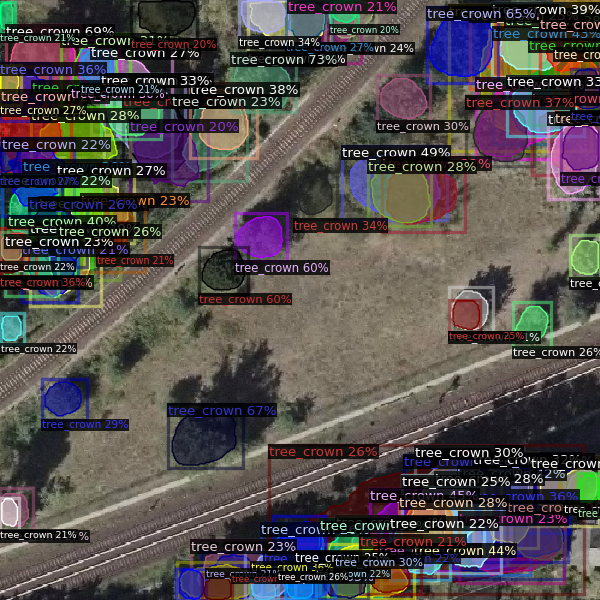

In [44]:
# Test on single image
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow

model_name = list(models.keys())[0]
cfg = cfgs[model_name]
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
predictor = DefaultPredictor(cfg)

img_path = dataset_dicts[5]["file_name"]
img = cv2.imread(img_path)
outputs = predictor(img)
print(outputs)  # Check if there are any predictions

v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(dataset_name), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [45]:
for model_name, results in evaluation_results.items():
    print(f"Results for {model_name}:")
    print(results)

Results for model_aoi400_5816_70p_1000i:
OrderedDict([('bbox', {'AP': 6.7897506796191625, 'AP50': 25.902461798261996, 'AP75': 1.0401261436310678, 'APs': 7.0699671231783885, 'APm': 7.497188870188483, 'APl': nan}), ('segm', {'AP': 4.5848752001413065, 'AP50': 19.107710067983273, 'AP75': 0.6834767929884585, 'APs': 3.5382932000995413, 'APm': 5.0572182987112715, 'APl': nan})])


range(0, 1)


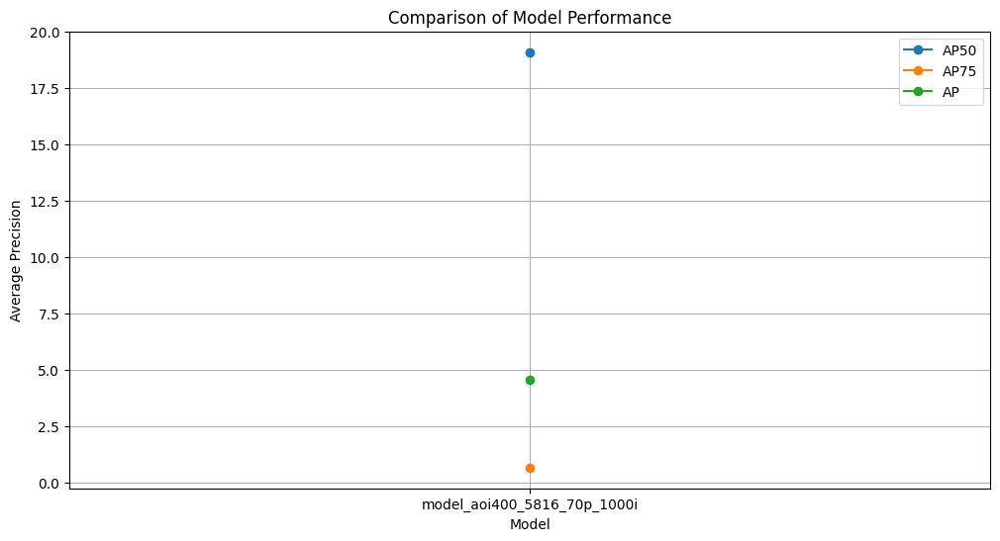

In [46]:
import matplotlib.pyplot as plt

# Example metrics to plot: AP at IoU=0.50 (AP50), AP at IoU=0.75 (AP75), and AP at IoU=0.50:0.95 (AP).
ap50, ap75, ap = [], [], []

for model_name, results in evaluation_results.items():
    # Assuming 'bbox' is the key for object detection metrics. Adjust if necessary.
    if 'segm' in results:
        metrics = results['segm']
        ap50.append(metrics.get('AP50', 0))
        ap75.append(metrics.get('AP75', 0))
        ap.append(metrics.get('AP', 0))

# Names of the models
model_names = list(evaluation_results.keys())

# Creating the plot
plt.figure(figsize=(12, 6))
x = range(len(model_names))
print(x)

plt.plot(x, ap50, label='AP50', marker='o')
plt.plot(x, ap75, label='AP75', marker='o')
plt.plot(x, ap, label='AP', marker='o')

plt.xticks(x, model_names)
plt.xlabel('Model')
plt.ylabel('Average Precision')
plt.title('Comparison of Model Performance')
plt.legend()
plt.grid(True)
plt.show()

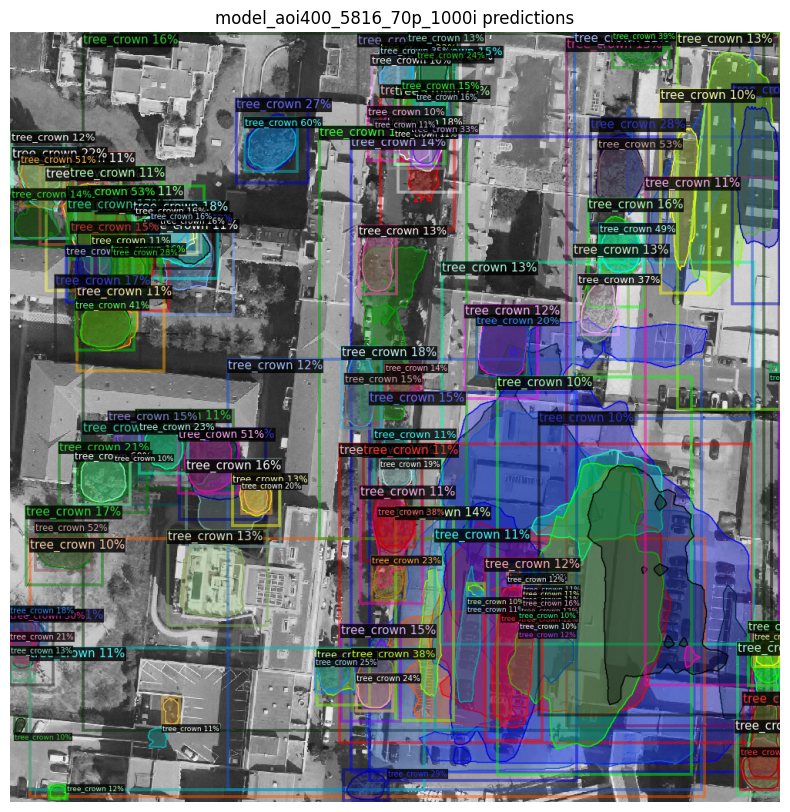

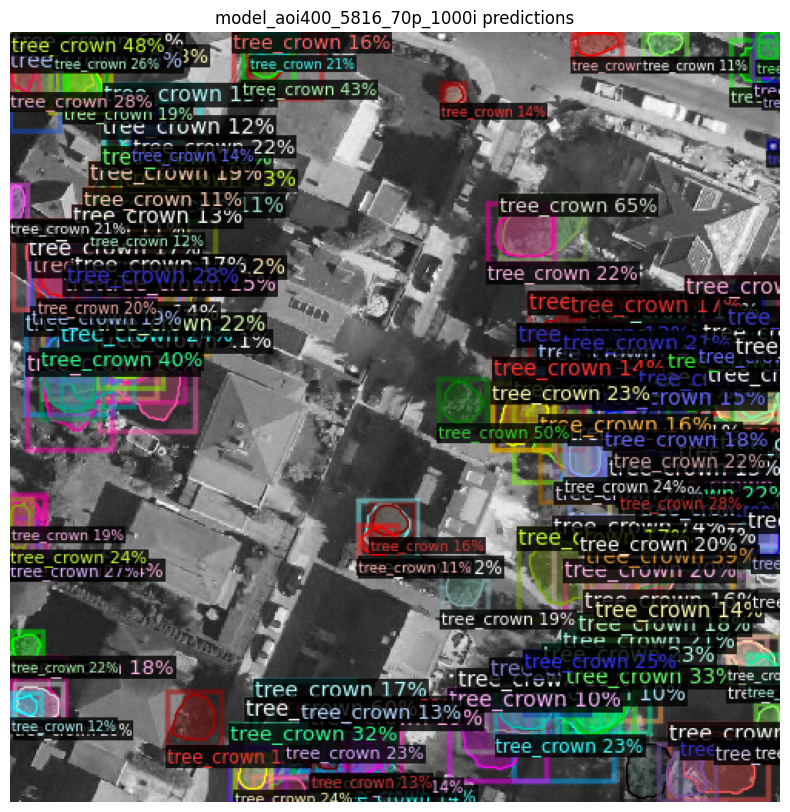

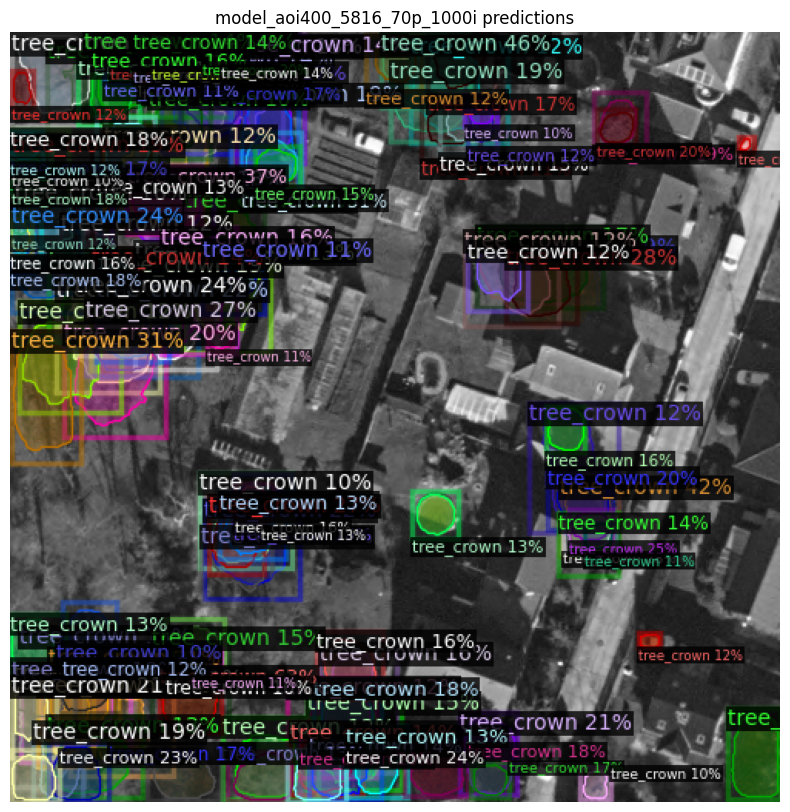

In [47]:
import glob
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import ColorMode, Visualizer
import cv2

# Directory where your new images are stored
new_images_directory = "/content/drive/MyDrive/data/test_imgs/"

# Load new images
new_images_paths = glob.glob(os.path.join(new_images_directory, "*.tif"))  # Adjust the pattern as needed

# Iterate over images and models
for image_path in new_images_paths:
    image = cv2.imread(image_path)
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for model_name, model in models.items():
        outputs = model(image)

        # Visualize the results
        v = Visualizer(image[:, :, ::-1],
                       metadata=my_dataset_val_metadata,
                       instance_mode=ColorMode.IMAGE_BW)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

        plt.figure(figsize=(10, 10))
        plt.imshow(out.get_image()[:, :, ::-1])
        plt.title(f"{model_name} predictions")
        plt.axis('off')
        plt.show()

### Detect overfitting

In [48]:
# Define your training dataset name and paths
train_dataset_name = 'my_dataset_train'
train_json_file = os.path.join(data_folder, "train.json")
train_image_root = image_root

def get_train_data():
    return load_coco_json(train_json_file, train_image_root)

# Remove and re-register the training dataset to ensure it's updated
if train_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(train_dataset_name)

DatasetCatalog.register(train_dataset_name, get_train_data)
MetadataCatalog.get(train_dataset_name).set(thing_classes=["tree_crown"])  # Update classes if different

# Print the metadata to confirm
my_dataset_train_metadata = MetadataCatalog.get(train_dataset_name)
print(my_dataset_train_metadata)


Metadata(name='my_dataset_train', thing_classes=['tree_crown'])


In [49]:
def evaluate_model(predictor, dataset_name, cfg):
    evaluator = COCOEvaluator(dataset_name, cfg, False, output_dir="/tmp/output")
    val_loader = build_detection_test_loader(cfg, dataset_name)
    results = inference_on_dataset(predictor.model, val_loader, evaluator)
    return results

def detect_overfitting_underfitting(models, cfgs, train_dataset_name, val_dataset_name):
    fit_results = {}
    threshold_for_overfitting = 0.15  # Adjust as needed, e.g., 0.1 to 0.2
    low_value_threshold = 0.25  # Adjust based on your minimum acceptable performance

    for model_name, predictor in models.items():
        print(f"Evaluating... {model_name}")

        # Evaluate on training and validation datasets
        train_results = evaluate_model(predictor, train_dataset_name, cfgs[model_name])
        val_results = evaluate_model(predictor, val_dataset_name, cfgs[model_name])

        # Compare performance metrics
        train_ap = train_results["segm"]["AP"]
        val_ap = val_results["segm"]["AP"]

        if train_ap > val_ap + threshold_for_overfitting:
            fit_status = "Overfitting"
        elif train_ap < low_value_threshold and val_ap < low_value_threshold:
            fit_status = "Underfitting"
        else:
            fit_status = "Good Fit"

        fit_results[model_name] = {
            "Training AP": train_ap,
            "Validation AP": val_ap,
            "Status": fit_status
        }

    return fit_results


In [50]:
fit_results = detect_overfitting_underfitting(models, cfgs, "my_dataset_train", "my_dataset_val")

# Display the results
for model_name, results in fit_results.items():
    print(f"Results for {model_name}: {results}")


Evaluating... model_aoi400_5816_70p_1000i
[07/12 09:52:21 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/12 09:52:21 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[07/12 09:52:21 d2.evaluation.coco_evaluation]: Trying to convert 'my_dataset_train' to COCO format ...
[07/12 09:52:21 d2.data.datasets.coco]: Converting annotations of dataset 'my_dataset_train' to COCO format ...)
[07/12 09:52:22 d2.data.datasets.coco]: Loading /content/drive/MyDrive/data/400_5816/train.json takes 1.04 seconds.
[07/12 09:52:22 d2.data.datasets.coco]: Loaded 168 images in COCO format from /content/drive/MyDrive/data/400_5816/train.json
[07/12 09:52:22 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/12 09:52:23 d2.data.datasets.coco]: Conversion finished, #images: 168, #annotations: 6236
[07/12 09:52:23 d2.data.datasets.coco]: 

In [51]:
from detectron2.data import DatasetCatalog, MetadataCatalog
import cv2
from detectron2.utils.visualizer import Visualizer, ColorMode
import numpy as np

# Load your dataset metadata (change 'my_dataset_val' to your dataset's name)
dataset_dicts = DatasetCatalog.get("my_dataset_val")
my_dataset_val_metadata = MetadataCatalog.get("my_dataset_val")


WARNING [07/12 09:54:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/12 09:54:59 d2.data.datasets.coco]: Loaded 43 images in COCO format from /content/drive/MyDrive/data/400_5816/val.json


In [52]:
from google.colab.patches import cv2_imshow

def visualize_false_positives(dataset_dicts, predictions, metadata):
    for img_dict, output in zip(dataset_dicts, predictions):
        # Load the image
        img = cv2.imread(img_dict["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)

        # Draw model predictions
        vis_output = visualizer.draw_instance_predictions(output["instances"].to("cpu"))

        # Draw ground truth annotations
        vis_output = visualizer.draw_dataset_dict(img_dict)

        # Convert image for display in Colab
        visualized_image = vis_output.get_image()[:, :, ::-1]

        # Display the image
        cv2_imshow(visualized_image)

In [53]:
import cv2

predictions = []
for d in dataset_dicts:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    predictions.append(outputs)


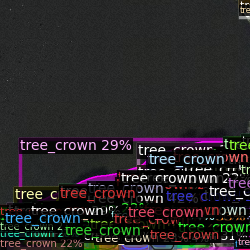

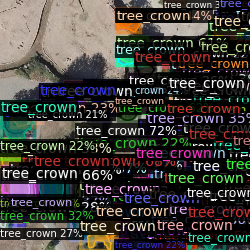

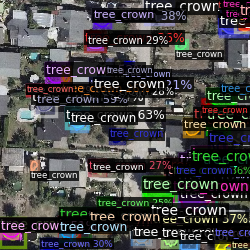

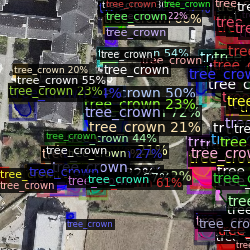

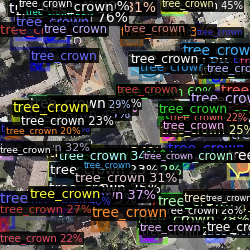

...

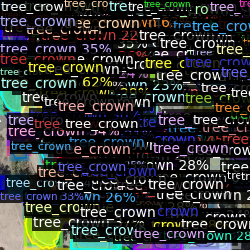

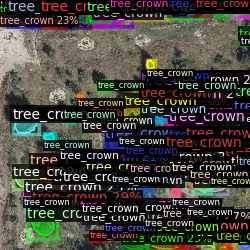

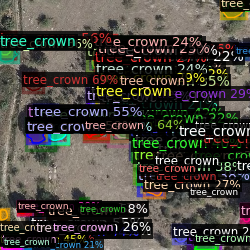

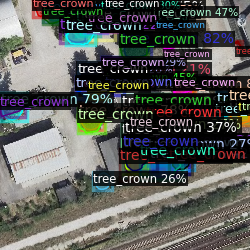

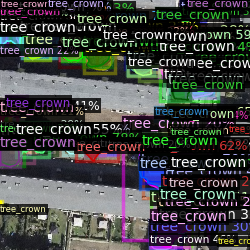

In [54]:
visualize_false_positives(dataset_dicts, predictions, my_dataset_val_metadata)

Export BBOX-es as geojson - not working

In [55]:
import pyproj
from shapely.ops import transform

def pixel_to_world(bbox, transform_matrix):
    # Converts bbox from pixel coordinates to world coordinates
    # bbox format: [x1, y1, x2, y2]
    minx, miny = rasterio.transform.xy(transform=transform_matrix, rows=bbox[1], cols=bbox[0], offset='ul')
    maxx, maxy = rasterio.transform.xy(transform=transform_matrix, rows=bbox[3], cols=bbox[2], offset='ul')
    return minx[0], miny[0], maxx[0], maxy[0]

def transform_to_epsg4326(bbox, original_crs):
    project = pyproj.Transformer.from_crs(pyproj.CRS(original_crs), pyproj.CRS('EPSG:4326'), always_xy=True).transform
    poly = Polygon([(bbox[0], bbox[1]), (bbox[2], bbox[1]), (bbox[2], bbox[3]), (bbox[0], bbox[3]), (bbox[0], bbox[1])])
    poly_epsg4326 = transform(project, poly)
    return poly_epsg4326


In [56]:
import numpy as np
from affine import Affine
import json
from affine import Affine

# Load the transform from the file
transform_array = np.loadtxt(f"{data_folder}/transform_matrix.txt").flatten()
transform = Affine(*transform_array)
transform_matrices = {}
# Load and deserialize the transform
with open(f"{data_folder}/transform.json", "r") as f:
    transform_data = json.load(f)
transform = Affine(*transform_data["transform"])

In [60]:
import json
import os
from shapely.geometry import mapping, Polygon, box
from detectron2.structures import Boxes, pairwise_iou
import torch
import rasterio.transform

def pixel_to_world(bbox, transform_matrix):
    """
    Converts bounding box coordinates from pixel space to world space.
    bbox: [x1, y1, x2, y2] format in pixel coordinates.
    transform_matrix: Affine transformation matrix.
    """
    minx, miny = rasterio.transform.xy(transform=transform_matrix, rows=bbox[1], cols=bbox[0], offset='ul')[0]
    maxx, maxy = rasterio.transform.xy(transform=transform_matrix, rows=bbox[3], cols=bbox[2], offset='ul')[0]
    return [minx, miny, maxx, maxy]


def convert_to_xyxy_format(boxes):
    # Converts boxes from [x, y, width, height] to [x1, y1, x2, y2] format
    new_boxes = []
    for box in boxes:
        x1, y1, w, h = box
        x2 = x1 + w
        y2 = y1 + h
        new_boxes.append([x1, y1, x2, y2])
    return new_boxes

def export_false_positives_to_geojson(dataset_dicts, predictions, metadata, output_folder, iou_threshold=0.5):
    for img_dict, output in zip(dataset_dicts, predictions):
        # Initialize GeoJSON structure for false positives
        geojson = {
            "type": "FeatureCollection",
            "features": []
        }

        instances = output["instances"].to("cpu")
        pred_boxes = Boxes(instances.pred_boxes.tensor)
        pred_classes = instances.pred_classes

        # Get ground truth boxes and classes
        gt_boxes = [ann["bbox"] for ann in img_dict["annotations"]]
        gt_boxes = convert_to_xyxy_format(gt_boxes)  # Convert to [x1, y1, x2, y2] format
        if gt_boxes:
            gt_boxes = Boxes(torch.tensor(gt_boxes).to(torch.float32))

            # Calculate IoU between each prediction and ground truth
            ious = pairwise_iou(pred_boxes, gt_boxes)

            for idx, bbox in enumerate(pred_boxes):
                # Determine if this prediction is a false positive
                max_iou = torch.max(ious[idx]).item()
                is_false_positive = max_iou < iou_threshold

                if is_false_positive:
                    bbox_poly = box(bbox[0].item(), bbox[1].item(), bbox[2].item(), bbox[3].item())
                    geojson_feature = mapping(bbox_poly)
                    # Create a GeoJSON feature
                    feature = {
                        "type": "Feature",
                        "properties": {
                            "class": metadata.thing_classes[pred_classes[idx]],
                            "confidence": instances.scores[idx].item()
                        },
                        "geometry": geojson_feature
                    }
                    geojson["features"].append(feature)

        # Write GeoJSON for false positives to file
        img_name = os.path.splitext(os.path.basename(img_dict["file_name"]))[0]
        output_path = os.path.join(output_folder, f"{img_name}_false_positives.geojson")
        with open(output_path, 'w') as f:
            json.dump(geojson, f)

# Example usage
output_folder = f"{data_folder}/false_positives_geojson"
os.makedirs(output_folder, exist_ok=True)
export_false_positives_to_geojson(dataset_dicts, predictions, my_dataset_val_metadata, output_folder)


In [63]:
def convert_to_xyxy_format(boxes):
    new_boxes = []
    for box in boxes:
        x1, y1, w, h = box
        x2 = x1 + w
        y2 = y1 + h
        new_boxes.append([x1, y1, x2, y2])
    return new_boxes


In [64]:
import rasterio.transform

def pixel_to_world(bbox, transform_matrix):
    """
    Converts bounding box coordinates from pixel space to world space.
    bbox: [x1, y1, x2, y2] format in pixel coordinates.
    transform_matrix: Affine transformation matrix.
    """
    # Extract individual coordinates
    x1, y1, x2, y2 = bbox
    # Convert top-left corner (x1, y1)
    minx, miny = rasterio.transform.xy(transform_matrix, y1, x1, offset='ul')
    # Convert bottom-right corner (x2, y2)
    maxx, maxy = rasterio.transform.xy(transform_matrix, y2, x2, offset='ul')
    return [minx, miny, maxx, maxy]


In [65]:
from shapely.geometry import mapping, Polygon
from detectron2.structures import Boxes, pairwise_iou
import json
import torch

def export_false_positives_to_geojson(dataset_dicts, predictions, metadata, output_folder, transform_matrices, iou_threshold=0.5):
    for img_dict, output in zip(dataset_dicts, predictions):
        file_path = img_dict['file_name']  # Get the file path of the image

        # Open the TIFF file and extract the affine transformation matrix
        with rasterio.open(file_path) as dataset:
            transform_matrices[file_path] = dataset.transform
        geojson = {
            "type": "FeatureCollection",
            "features": [],  # This will be filled with the above 'feature' objects
            "crs": {
                "type": "name",
                "properties": {
                    "name": "urn:ogc:def:crs:EPSG::25833"
                }
            }
        }

        instances = output["instances"].to("cpu")
        pred_boxes = Boxes(instances.pred_boxes.tensor)
        pred_classes = instances.pred_classes

        gt_boxes = [ann["bbox"] for ann in img_dict["annotations"]]
        gt_boxes = convert_to_xyxy_format(gt_boxes)
        if gt_boxes:
            gt_boxes = Boxes(torch.tensor(gt_boxes).to(torch.float32))
            ious = pairwise_iou(pred_boxes, gt_boxes)

            for idx, bbox in enumerate(pred_boxes):
                max_iou = torch.max(ious[idx]).item()
                is_false_positive = max_iou < iou_threshold

                if is_false_positive:
                    transform_matrix = transform_matrices[img_dict['file_name']]
                    bbox_world = pixel_to_world(bbox.numpy(), transform_matrix)
                    poly = Polygon([(bbox_world[0], bbox_world[1]), (bbox_world[2], bbox_world[1]),
                                    (bbox_world[2], bbox_world[3]), (bbox_world[0], bbox_world[3]),
                                    (bbox_world[0], bbox_world[1])])
                    geojson_feature = mapping(poly)

                    # Create a GeoJSON feature
                    feature = {
                        "type": "Feature",
                        "properties": {
                        "class": metadata.thing_classes[pred_classes[idx]],
                        "confidence": instances.scores[idx].item()
                        },
                        "geometry": geojson_feature
                        }
                    geojson["features"].append(feature)
                    # Write GeoJSON for false positives to file
                    img_name = os.path.splitext(os.path.basename(img_dict["file_name"]))[0]
                    output_path = os.path.join(output_folder, f"{img_name}_false_positives.geojson")
                    with open(output_path, 'w') as f:
                        json.dump(geojson, f)


In [66]:
os.makedirs(output_folder, exist_ok=True)
export_false_positives_to_geojson(dataset_dicts, predictions, my_dataset_val_metadata, output_folder, transform_matrices)